In [5]:
import os
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import  LatentDirichletAllocation
import numpy as np
from bs4 import BeautifulSoup
import re
import xml.sax.saxutils as saxutils
from nltk.tokenize import RegexpTokenizer, sent_tokenize
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from gensim.models import Word2Vec
import sys
import tensorflow as tf
import matplotlib.pyplot as plt
import math

In [6]:
this = sys.modules[__name__]


nltk.download('punkt')
nltk.download('stopwords')

this.tokenizer = RegexpTokenizer('[\'a-zA-Z]+')
this.lemmatizer = WordNetLemmatizer()
this.vocabulary = []
this.categories = []
this.stop_words = set(stopwords.words('english'))

def generate_categories():
    this.categories = []
    """Generate the list of categories."""
    topics = 'all-topics-strings.lc.txt'

    with open('./reuters21578/' + topics, 'r') as file:
        for category in file.readlines():
            this.categories.append(category.strip().lower())


def vectorize_docs(documents, w2v_model):
    """A weird oneshot representation for word2vec."""
    document_max_num_words = 100
    num_features = 500

    x = np.zeros(shape=(this.number_of_documents, document_max_num_words,
                        num_features)).astype(np.float32)

    empty_word = np.zeros(num_features).astype(np.float32)

    for idx, document in enumerate(documents):
        for jdx, word in enumerate(document):
            if jdx == document_max_num_words:
                break

            else:
                if word in w2v_model:
                    x[idx, jdx, :] = w2v_model[word]
                else:
                    x[idx, jdx, :] = empty_word

    return x


def vectorize_categories(categories):
    num_categories = len(this.categories)

    y = np.zeros(shape=(this.number_of_documents, num_categories)).astype(np.float32)

    for idx, key in enumerate(categories.keys()):
        y[idx, :] = categories[key]

    return y


def unescape(text):
    """Unescape charactes."""
    return saxutils.unescape(text)


def unique(arr):
    return list(set(arr))


def add_to_vocab(elements):
    for element in elements:
        if element not in this.vocabulary:
            this.vocabulary.append(element)


def add_to_categories(elements):
    for element in elements:
        if element not in this.categories:
            this.categories.append(element)


def transform_to_indices(elements):
    res = []
    for element in elements:
        res.append(this.vocabulary.index(element))
    return res


def transform_to_category_indices(element):
    return this.categories.index(element)


def strip_tags(text):
    """String tags for a better vocabulary."""
    return re.sub('<[^<]+?>', '', text).strip()


def to_category_onehot(categories):
    """Create onehot vectors for categories."""
    target_categories = this.categories
    vector = np.zeros(len(target_categories)).astype(np.float32)

    for i in range(len(target_categories)):
        if target_categories[i] in categories:
            vector[i] = 1.0

    return vector

def read_retuters_files(path="./reuters21578/"):
    x_train = {}
    x_test = {}
    y_train = {}
    y_test = {}

    for file in os.listdir(path):
        if file.endswith(".sgm"):
            print("reading ", path + file)
            f = open(path + file, 'r')
            data = f.read()

            soup = BeautifulSoup(data)
            posts = soup.findAll("reuters")
            
            
            for post in posts:
                post_id = post['newid']
                body = unescape(strip_tags(str(post('text')))
                                .replace('reuter\n&#3;', ''))
                post_categories = []

                topics = post.topics.contents

                for topic in topics:
                    post_categories.append(strip_tags(str(topic)))

                category_onehot = to_category_onehot(post_categories)
                
                cross_validation_type = post["lewissplit"]
                if (cross_validation_type == "TRAIN"):
                    x_train[post_id] = body
                    y_train[post_id] = category_onehot
                else:
                    x_test[post_id] = body
                    y_test[post_id] = category_onehot
            
    return (x_train, y_train), (x_test, y_test)

def tokenize(document):
    words = []

    for sentence in sent_tokenize(document):
        tokens = [this.lemmatizer.lemmatize(t.lower()) for t in this.tokenizer.tokenize(sentence)
                  if t.lower() not in this.stop_words]
        words += tokens

    return words


def tokenize_docs(document):
    tokenized_docs = []
    this.number_of_documents = len(document)

    for key in document.keys():
        tokenized_docs.append(tokenize(document[key]))

    return tokenized_docs

[nltk_data] Downloading package punkt to /Users/gobidasu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/gobidasu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [7]:
generate_categories()
(x_train, y_train), (x_test, y_test) = read_retuters_files()



('reading ', './reuters21578/reut2-004.sgm')
('reading ', './reuters21578/reut2-010.sgm')
('reading ', './reuters21578/reut2-011.sgm')
('reading ', './reuters21578/reut2-005.sgm')
('reading ', './reuters21578/reut2-013.sgm')
('reading ', './reuters21578/reut2-007.sgm')
('reading ', './reuters21578/reut2-006.sgm')
('reading ', './reuters21578/reut2-012.sgm')
('reading ', './reuters21578/reut2-016.sgm')
('reading ', './reuters21578/reut2-002.sgm')
('reading ', './reuters21578/reut2-003.sgm')
('reading ', './reuters21578/reut2-017.sgm')
('reading ', './reuters21578/reut2-001.sgm')
('reading ', './reuters21578/reut2-015.sgm')
('reading ', './reuters21578/reut2-014.sgm')
('reading ', './reuters21578/reut2-000.sgm')
('reading ', './reuters21578/reut2-019.sgm')
('reading ', './reuters21578/reut2-018.sgm')
('reading ', './reuters21578/reut2-020.sgm')
('reading ', './reuters21578/reut2-008.sgm')
('reading ', './reuters21578/reut2-009.sgm')
('reading ', './reuters21578/reut2-021.sgm')


In [14]:
def strip_oneHotEncoder( x, l = 1014):
    x = ''.join(e for e in x if e.isalpha())
    x = x.lower()
    
    x = x[:l]
    idxs = np.fromstring(x,dtype=np.uint8)-97
    one_hot = np.zeros((l, 70))
    j = 0
    for i in idxs:
        one_hot[j][i] =1
        j += 1
    return  one_hot


X_train = x_train.values()
X_train = np.asarray(list(map(strip_oneHotEncoder, X_train)))

X_test = x_test.values()
X_test = np.asarray(list(map(strip_oneHotEncoder, X_test)))[:500, :, :] # limit computation time


/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:6: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


In [15]:
Y_train = np.asarray(list(y_train.values()))
Y_test = np.asarray(list(y_test.values()))[:500,:] # limit computation time

print(X_train[0])

print(type(X_train))
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

Y_train = np.argmax(Y_train, axis=1).reshape((Y_train.shape[0],1))
Y_test = np.argmax(Y_test, axis=1).reshape((Y_test.shape[0],1))
print(Y_train.shape, Y_test.shape)

#small data sample
X_train=X_train[:500,:,:] #500
Y_train=Y_train[:500,:] #500
print(X_train.shape, Y_train.shape)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
<type 'numpy.ndarray'>
(14668, 1014, 70)
(500, 1014, 70)
(14668, 135)
(500, 135)
((14668, 1), (500, 1))
((500, 1014, 70), (500, 1))


In [19]:
print(x_train)

{u'1869': "[\\x02\\nNBI <NBI> INTRODUCES NEW PRODUCTS\\n    CHICAGO, Ill, March 4 - NBI inc said it has reduced prices\\nof on its 5000 series publishing workstations by 30 pct and has\\nintroduced a new electronic publishing workstation, a\\nmini-computer and an image scanner at the Corporate Electronic\\nPUblishing Systems Show.\\n    All of NBI's 5000 Series are included in the new pricing\\nincluding the Integrated workstation formerly priced at 14,490\\ndlrs and the pro publisher formerly priced at 15,490 dlrs.\\n  \\n Reuter\\n\\x03]", u'3382': '[\\x02\\nAMERICUS TRUST <BYU> <BYP> INITIAL QTRLY DIV\\n    NEW YORK, March 9 - Americus Trust For Bristol Myers shares\\nannounced an initial dividend of 68.75 cts payable May 12 for\\nshareholders of record April 3.\\n Reuter\\n\\x03]', u'4446': '[\\x02\\nIPCO CORP <IHS> SETS REGULAR PAYOUT\\n    WHITE PLAINS, N.Y., March 12 -\\n    Qtrly div nine cts vs nine cts prior\\n    Pay May 1\\n    Record April 9\\n Reuter\\n\\x03]', u'4447': '

In [34]:
print(x_train['4446'])
print(np.argmax(y_train['4446']))
y_train.keys()

[\x02\nIPCO CORP <IHS> SETS REGULAR PAYOUT\n    WHITE PLAINS, N.Y., March 12 -\n    Qtrly div nine cts vs nine cts prior\n    Pay May 1\n    Record April 9\n Reuter\n\x03]
35


[u'1869',
 u'3382',
 u'4446',
 u'4447',
 u'11542',
 u'11543',
 u'11540',
 u'11541',
 u'11546',
 u'11547',
 u'11544',
 u'11545',
 u'11548',
 u'11549',
 u'5988',
 u'5989',
 u'5982',
 u'5983',
 u'5980',
 u'5981',
 u'5986',
 u'5987',
 u'5984',
 u'5985',
 u'820',
 u'6796',
 u'6797',
 u'6794',
 u'6795',
 u'6792',
 u'6793',
 u'6790',
 u'6791',
 u'6798',
 u'6799',
 u'6296',
 u'270',
 u'271',
 u'272',
 u'273',
 u'274',
 u'275',
 u'276',
 u'277',
 u'278',
 u'279',
 u'9460',
 u'8521',
 u'12019',
 u'12018',
 u'12015',
 u'12014',
 u'12017',
 u'12016',
 u'12011',
 u'12010',
 u'12013',
 u'12012',
 u'10709',
 u'10708',
 u'9528',
 u'9529',
 u'9258',
 u'9259',
 u'10703',
 u'10702',
 u'10701',
 u'10700',
 u'10707',
 u'10706',
 u'10705',
 u'10704',
 u'3282',
 u'934',
 u'8907',
 u'9729',
 u'14729',
 u'3519',
 u'3518',
 u'1936',
 u'3513',
 u'3512',
 u'3511',
 u'3510',
 u'3517',
 u'3516',
 u'3515',
 u'3514',
 u'2688',
 u'2689',
 u'2684',
 u'2685',
 u'2686',
 u'2687',
 u'2680',
 u'2681',
 u'2682',
 u'2683',
 

('x.shape', TensorShape([Dimension(None), Dimension(1014), Dimension(70)]))
('y.shape', TensorShape([Dimension(None), Dimension(1)]))
('X_train', (500, 1014, 70))
('Y_train', (500, 1))
Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See tf.nn.softmax_cross_entropy_with_logits_v2.

doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
Cost after epoch 0: 4.660526
doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
Cost after epoch 1: 2.252831
doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
Cost after epoch 2: 1.749963
doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
Cost after epoch 3: 1.587747
doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
doing a minibatch
Cost after epoch 4: 1.450662
doing a minibatch
doing a minib

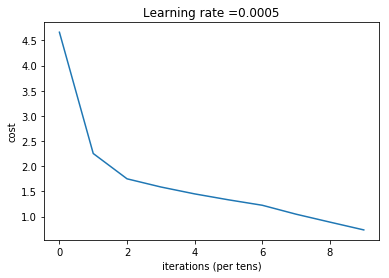

('Train Accuracy:', 0.4430074)
('Test Accuracy:', 0.50373334)


In [17]:
def random_mini_batches(X, Y, mini_batch_size = 64, seed = 0):
    """
    Creates a list of random minibatches from (X, Y)
    
    Arguments:
    X -- input data, of shape (input size, number of examples)
    Y -- true "label" vector (containing 0 if cat, 1 if non-cat), of shape (1, number of examples)
    mini_batch_size - size of the mini-batches, integer
    seed -- this is only for the purpose of grading, so that you're "random minibatches are the same as ours.
    
    Returns:
    mini_batches -- list of synchronous (mini_batch_X, mini_batch_Y)
    """
    
    m = X.shape[0]                  # number of training examples
    mini_batches = []
    np.random.seed(seed)
    #print('m:', X.shape[0], Y.shape[0])
    
    # Step 1: Shuffle (X, Y)
    permutation = list(np.random.permutation(m))
    #print('X.shape:', X.shape, 'Y.shape:', Y.shape)
    shuffled_X = X[permutation, :, :]
    
    shuffled_Y = Y[permutation, :] #.reshape((m, Y.shape[1]))

    # Step 2: Partition (shuffled_X, shuffled_Y). Minus the end case.
    num_complete_minibatches = int(math.floor(m/mini_batch_size)) # number of mini batches of size mini_batch_size in your partitionning
    for k in range(0, num_complete_minibatches):
        mini_batch_X = shuffled_X[k * mini_batch_size : k * mini_batch_size + mini_batch_size, :, :]
        mini_batch_Y = shuffled_Y[k * mini_batch_size : k * mini_batch_size + mini_batch_size, :]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    # Handling the end case (last mini-batch < mini_batch_size)
    if m % mini_batch_size != 0:
        mini_batch_X = shuffled_X[num_complete_minibatches * mini_batch_size : m, :, :]
        mini_batch_Y = shuffled_Y[num_complete_minibatches * mini_batch_size : m, :]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    return mini_batches

# clear old variables
tf.reset_default_graph()

# setup input (e.g. the data that changes every batch)
# The first dim is None, and gets sets automatically based on batch size fed in
L = 1014 
NUM_FILTERS = 256 # 1024 for large, 256 for small
NOUT = 1024 # 2048 for large, 1024 for small 
NUM_CHAR_OPTIONS = 70
STD_INIT = 0.02 # 0.02 for large, 0.05 for small 

num_categories = 135

x = tf.placeholder(tf.float32, [None, L, NUM_CHAR_OPTIONS])
y = tf.placeholder(tf.int64, [None, 1]) 
is_training = tf.placeholder(tf.bool)

num_epochs = 10 # 10
minibatch_size = 100
seed = 1
costs = [] 

def simple_model(x,y):    
    conv1 = tf.layers.conv1d(x, filters=NUM_FILTERS, kernel_size=7, strides=1, padding='SAME', 
                                   kernel_initializer=tf.initializers.random_normal(mean=0, stddev=STD_INIT), 
                                   # defaults to NWC
                                   activation=tf.nn.relu, reuse=None, name="conv1") 
    pool1 = tf.layers.max_pooling1d(conv1, pool_size=3, strides=1, padding='VALID', data_format='channels_last', name="pool1") 
    
    #conv2 = tf.layers.conv1d(pool1, filters=NUM_FILTERS, kernel_size=7, strides=1, padding='SAME', 
    #                               activation=tf.nn.relu, reuse=None, name="conv2") 
    #pool2 = tf.layers.max_pooling1d(conv2, pool_size=3, strides=1, padding='VALID', data_format='channels_last', name="pool2")
    
    conv3 = tf.layers.conv1d(pool1, filters=NUM_FILTERS, kernel_size=3, strides=1, padding='SAME', 
                                   activation=tf.nn.relu, reuse=None, name="conv3")  # pool2
    
    #conv4 = tf.layers.conv1d(conv3, filters=NUM_FILTERS, kernel_size=3, strides=1, padding='SAME', 
    #                               activation=tf.nn.relu, reuse=None, name="conv4") 
    
    #conv5 = tf.layers.conv1d(conv4, filters=NUM_FILTERS, kernel_size=3, strides=1, padding='SAME', 
    #                               activation=tf.nn.relu, reuse=None, name="conv5") 
    
    conv6 = tf.layers.conv1d(conv3, filters=NUM_FILTERS, kernel_size=3, strides=1, padding='SAME', 
                                   activation=tf.nn.relu, reuse=None, name="conv6") # conv5
    pool6 = tf.layers.max_pooling1d(conv6, pool_size=3, strides=1, padding='VALID', data_format='channels_last', name="pool6")
    
    fc7 = tf.contrib.layers.fully_connected(inputs=tf.contrib.layers.flatten(pool6), num_outputs=NOUT, reuse=None, 
                                      scope="fc7")
    fc8 = tf.contrib.layers.fully_connected(inputs=tf.contrib.layers.flatten(fc7), num_outputs=NOUT, reuse=None, 
                                      scope="fc8")
    fc9 = tf.contrib.layers.fully_connected(inputs=tf.contrib.layers.flatten(fc7), num_outputs=num_categories, reuse=None, 
                                      scope="fc9")
    
    return fc9

print('x.shape', x.shape)
print('y.shape', y.shape)
print('X_train', X_train.shape)
print('Y_train', Y_train.shape)

y_out = simple_model(x,y)

# define our loss
total_loss = tf.nn.softmax_cross_entropy_with_logits(logits = y_out, labels = tf.one_hot(y, num_categories)) # yahoo  

# tf.losses.hinge_loss(tf.one_hot(y,10),logits=y_out)
mean_loss = tf.reduce_mean(total_loss)

# define our optimizer
optimizer = tf.train.AdamOptimizer(5e-4).minimize(mean_loss)

init = tf.global_variables_initializer()
              
with tf.Session() as sess:
    sess.run(init)
    # should loop over minibatches
    for epoch in range(num_epochs):
        #print epoch
        epoch_cost = 0.                       # Defines a cost related to an epoch
        num_minibatches = int(X_train.shape[0] / minibatch_size) # number of minibatches of size minibatch_size in the train set
        seed = seed + 1
        minibatches = random_mini_batches(X_train, Y_train, minibatch_size, seed)
        #minibatches = copy.deepcopy(minibatches_result)
        
        for minibatch in minibatches:
            print('doing a minibatch')
            # Select a minibatch
            (minibatch_X, minibatch_Y) = minibatch
                
            # IMPORTANT: The line that runs the graph on a minibatch.
            # Run the session to execute the "optimizer" and the "cost", the feedict should contain a minibatch for (X,Y).
            ### START CODE HERE ### (1 line)
            #print('minibatch shapes:', minibatch_X.shape, minibatch_Y.shape)
            _ , minibatch_cost = sess.run([optimizer, mean_loss], feed_dict={x: minibatch_X, y: minibatch_Y})
            ### END CODE HERE ###
                
            epoch_cost += minibatch_cost / num_minibatches

        # Print the cost every epoch
        if epoch % 1 == 0: #100
            print ("Cost after epoch %i: %f" % (epoch, epoch_cost))
        if epoch % 1 == 0: #5
            costs.append(epoch_cost)
                
    # plot the cost
    plt.plot(np.squeeze(costs))
    plt.ylabel('cost')
    plt.xlabel('iterations (per tens)')
    plt.title("Learning rate =" + str(5e-4))
    plt.show()

    # lets save the parameters in a variable
    #parameters = sess.run(parameters)
    #print ("Parameters have been trained!")

    # Calculate the correct predictions
    correct_prediction = tf.equal(tf.argmax(y_out), y) # maybe no need for tf.argmax(y), see placeholder of y above? 

    # Calculate accuracy on the test set
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, "float"))
 
    print ("Train Accuracy:", accuracy.eval({x: X_train, y: Y_train}))
    print ("Test Accuracy:", accuracy.eval({x: X_test, y: Y_test}))

    #_ , minibatch_cost = sess.run([optimizer, cost], feed_dict={x: X_int, y: Y_train}) # minibatch_X, minibatch_Y
    #print ("Cost:", minibatch_cost)
    #result = sess.run(y_out)
    #print result
    

In [4]:
# Calculate the correct predictions
correct_prediction = tf.equal(tf.argmax(y_out), y) # maybe no need for tf.argmax(y), see placeholder of y above? 

# Calculate accuracy on the test set
accuracy = tf.reduce_mean(tf.cast(correct_prediction, "float"))

print ("Train Accuracy:", accuracy.eval({x: X_train, y: Y_train}))
print ("Test Accuracy:", accuracy.eval({x: X_test, y: Y_test}))

NameError: name 'y_out' is not defined